In [121]:
import pandas as pd
from arctic import Arctic
import matplotlib.pyplot as plt

In [2]:
store = Arctic('localhost')
store.list_libraries()

['test', 'Tick_store']

In [3]:
library = store['Tick_store']
library.list_symbols()

['BTC', 'BTCUSD']

In [4]:
df = library.read('BTCUSD')

In [9]:
price_lvl = df.price.unique()
max_size = df['size'].max(skipna=True)

In [42]:
start = df.index[0]
end = df.index[-1]

In [151]:
def get_lvl_color(value, max_):
    if value == None:
        return (0, 0, 0)
    lvl = value / max_
    if lvl >= 0.90:
        return (0, 1, 1)
    elif lvl > 0.33 or lvl < 0.90:
        return (0, lvl, lvl)
    else:
        return (0, 0, 0)

In [152]:
y = []
x_start = []
x_end = []
col = []

upper = 38000
lower = 35000

for n in range(len(price_lvl)):
    plvl = price_lvl[n]

    if plvl > upper or plvl < lower:
        continue

    tmp = df[df.price == price_lvl[n]]
    if len(tmp) > 1:
        for t in range(len(tmp)):
            if t == len(tmp)-1:
                y.append(plvl)
                x_start.append(tmp.index[t])
                x_end.append(end)
                col.append(get_lvl_color(tmp['size'][t], max_size))
            else:
                y.append(plvl)
                x_start.append(tmp.index[t])
                x_end.append(tmp.index[t+1])
                col.append(get_lvl_color(tmp['size'][t], max_size))
    else:
        y.append(plvl)                
        x_start.append(tmp.index[0])
        x_end.append(end)
        col.append(get_lvl_color(tmp['size'][0], max_size))

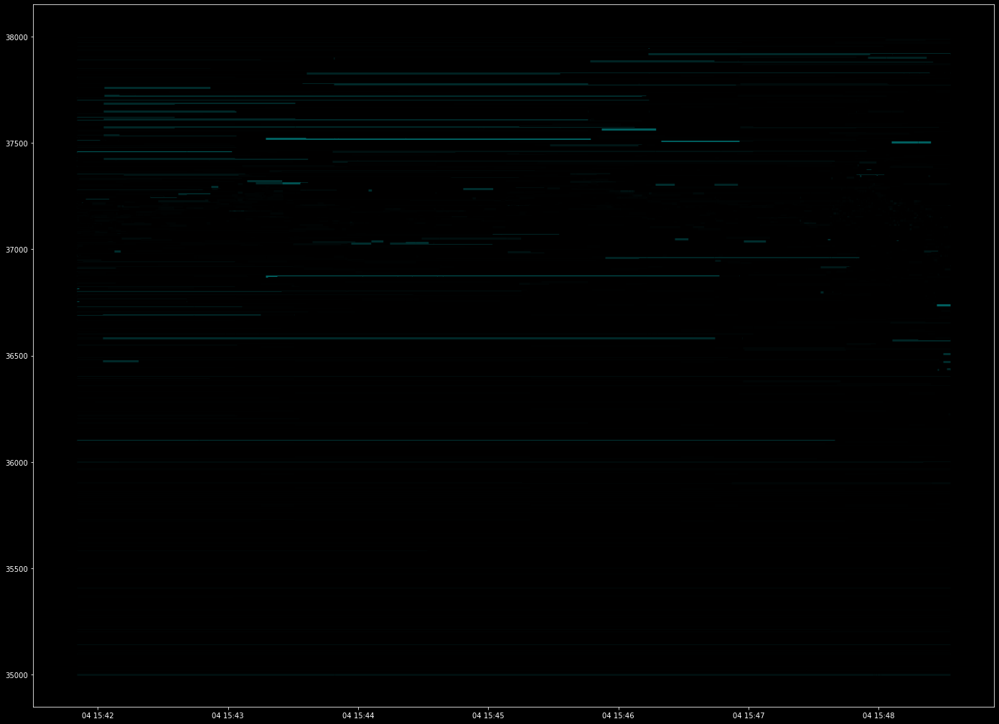

In [153]:
plt.style.use('dark_background')
plt.figure(figsize=(24, 18))
plt.hlines(y, pd.to_datetime(x_start), pd.to_datetime(x_end), lw=3, color=col, alpha=1, zorder=0)
plt.show()